### Objective

In this notebook, we create a simple demo to showcase the concept of role-playing dual-chatbot for digesting ABB Review articles.

### 1. Import libraries

In [51]:
from chatbot import JournalistBot, AuthorBot
from embedding_engine import Embedder
from topic_classifier import TopicClassifier
import utilities
from pdf2image import convert_from_path
import azure.cognitiveservices.speech as speechsdk
from pydub import AudioSegment
import PyPDF2
import os

import ipywidgets as widgets
from IPython.display import display, HTML, IFrame, Audio, clear_output

We consider 4 issues of ABB Review

In [2]:
filenames = {
    'ABB Review 2022-03': 'ABB Review_03_2022_layout complete_EN_72-200dpi.pdf',
    'ABB Review 2023-01': 'ABB Review_01_2023_layout complete_EN_72-300dpi.pdf',
    'ABB Review 2023-02': 'ABB Review_02_2023_layout complete_EN_72-300dpi.pdf',
    'ABB Review 2023-03': 'ABB Review_03_2023_layout complete_EN_300dpi.pdf',
}

### 2. User journey

We instantiate an empty dictionary to store user selections.

In [3]:
user_journey = {}

#### 2.1 User selects journal issue 

In [4]:
# Create radio buttons for the journal issues
journal_issues = ['ABB Review 2022-03', 'ABB Review 2023-01', 
                  'ABB Review 2023-02', 'ABB Review 2023-03']

# User selection
issue_buttons = widgets.RadioButtons(
    options=journal_issues,
    value=None,  
    description='',
    disabled=False
)

output = widgets.Output()

# Display UI elements
display(HTML('<span style="font-weight:bold; font-size:18px;">Journal Issues:</span>'))
display(widgets.HBox([issue_buttons, output]))

# Function to display the first page of the selected journal
def show_journal_cover(journal_name):  
    file_path = os.path.join("./papers", filenames[journal_name])
    
    # Convert the first page of the PDF to an image
    images = convert_from_path(file_path, first_page=1, last_page=1, size=(300, None))
    
    # Clear the previous image
    output.clear_output()

    # Display the new image
    with output:
        display(images[0])

# Function to update and display the selected value
def on_value_change(change):
    if change['new'] in filenames:
        user_journey["selected_journal"] = filenames[change['new']]
        show_journal_cover(change['new'])

# Set up an observer to watch for changes
issue_buttons.observe(on_value_change, names='value')

#### 2.2 User selects article

We first extract articles in the user-selected issue.

In [5]:
articles = utilities.extract_articles(user_journey["selected_journal"])
print(articles)

[{'start_page': 5, 'title': 'Editorial', 'subtitle': '', 'length': 5}, {'start_page': 10, 'title': 'For greater results', 'subtitle': 'High Speed Alignment – visual servoing technology for ultra- high precision assembly', 'length': 8}, {'start_page': 18, 'title': 'The right moves', 'subtitle': 'Software that optimizes robot performance', 'length': 6}, {'start_page': 24, 'title': 'The DCS of tomorrow', 'subtitle': 'Envisioning the future of process automation', 'length': 6}, {'start_page': 30, 'title': 'Safe cyber space', 'subtitle': 'ABB Ability™ Cyber Security Workplace', 'length': 6}, {'start_page': 36, 'title': 'The virtues of  virtualization', 'subtitle': 'Virtual protection and control for medium-  voltage substations', 'length': 6}, {'start_page': 42, 'title': 'Health monitor', 'subtitle': 'Better service decisions with ABB Ability™ Smart Master', 'length': 4}, {'start_page': 46, 'title': 'Access is everything', 'subtitle': 'Opening the door to a world of information', 'length': 

We then present the article list for users to select

In [6]:
article_widgets = []

def toggle_handler(change, article, button):
    if change['new']:  # Only act on the 'toggle on' action
        user_journey["selected_article"] = article
        # Deselect all other buttons
        for other_button in all_buttons:
            if other_button != button:
                other_button.value = False

all_buttons = []  # List to store all toggle buttons

for article in articles:
    title_button = widgets.ToggleButton(
        value=False,
        description=article['title'],
        tooltip=article['title'],
        button_style='',
        layout=widgets.Layout(width='90%')
    )
    subtitle_label = widgets.Label(
        value=article['subtitle'],
        layout=widgets.Layout(margin='0 0 20px 25px')  # Bottom margin added
    )
    
    # Attach the handler to the toggle button's value change event
    title_button.observe(lambda change, article=article, button=title_button: toggle_handler(change, article, button), names='value')
    all_buttons.append(title_button)
    
    # Group the button and label in a vertical box (VBox)
    group = widgets.VBox([title_button, subtitle_label])
    article_widgets.append(group)

# Layout the grouped widgets in a two-column grid
grid = widgets.GridBox(article_widgets, layout=widgets.Layout(grid_template_columns="repeat(2, 50%)"))

# Add a title label
title_label = widgets.HTML(value='<span style="font-size: 18px; font-weight: bold;">List of Articles:</span>', layout=widgets.Layout(margin='0 0 10px 0'))


display(title_label, grid)

HTML(value='<span style="font-size: 18px; font-weight: bold;">List of Articles:</span>', layout=Layout(margin=…

GridBox(children=(VBox(children=(ToggleButton(value=False, description='Editorial', layout=Layout(width='90%')…

We can also present the original PDF to the user.

In [7]:
def split_pdf(input_pdf_path, output_pdf_path, start_page, end_page):
    """Extracts a range of pages from a PDF and saves it as a new PDF.
    """
    with open(input_pdf_path, 'rb') as source_pdf:
        pdf_reader = PyPDF2.PdfReader(source_pdf)
        pdf_writer = PyPDF2.PdfWriter()
        
        for page_num in range(start_page, end_page + 1):
            page = pdf_reader.pages[page_num-1]
            pdf_writer.add_page(page)
        
        with open(output_pdf_path, 'wb') as output_pdf:
            pdf_writer.write(output_pdf)

In [8]:
# Extract selected PDF
split_pdf(input_pdf_path="./papers/"+user_journey['selected_journal'],
         output_pdf_path="./papers/temp.pdf",
         start_page=user_journey['selected_article']['start_page'],
         end_page=user_journey['selected_article']['start_page']+user_journey['selected_article']['length']-1)

# Display selected article
display(IFrame("./papers/temp.pdf", width=1000, height=600))

#### 2.3 Topic classification

Once the article is selected, we can run a topic classification to determine the relevant topics.

In [9]:
themes = {
        
    'Tech and product insights': {
        'description': 'Spotlight on new tech and product',
        'target audience': 'R&D engineers',
        'prompt': f"""
        - Seek detailed information about the technology and product advancements. 
        - Explore the underlying tech innovations and their advantages.
        - Discuss product features, benefits, and differentiators.
        """
    },
    
    'Market dynamics': {
        'description': 'Explore the market implications',
        'target audience': 'marketing professionals',
        'prompt': f"""
        - Seek detailed information about market implications and relevance.
        - Explore challenges and opportunities in the current market scenario.
        - Discuss marketable insights and strategies. 
        """
    },
    
    'Operational transformation': {
        'description': 'Insights on optimized processes and operations',
        'target audience': 'operational experts & managers',
        'prompt': f"""
        - Seek detailed information about changes in operational processes and efficiency gains. 
        - Explore how the transformations impact daily operations and long-term strategies.
        """
    },
    
    'Sustainability initiatives': {
        'description': "ABB's contributions to environmental sustainability",
        'target audience': 'sustainability officers',
        'prompt': f"""
        - Seek detailed information about ABB's sustainability strategies and solutions.
        - Explore the measurable impacts of the sustainability initiatives.
        """
    },
    
    'Customer experience': {
        'description': "Dive into the end-user benefits and experiences",
        'target audience': 'customers',
        'prompt': f"""
        - Explore how ABB’s solutions and products enhance user interactions and satisfaction.
        """
    },
    
    'Industry challenges and opportunities': {
        'description': "Peering into hurdles and growth areas",
        'target audience': 'business developers',
        'prompt': f"""
        - Discuss industry-wide pain points.
        - Explore ABB’s strategies to tackle them.
        - Explore the potential for growth
        """
    },
    
    'Strategic collaborations': {
        'description': "Highlighting strategic partnerships",
        'target audience': 'partnership managers',
        'prompt': f"""
        - Inquire about the nature and objectives of ABB's partnerships and strategic collaborations. 
        - Discuss the synergies achieved through such collaborations.
        """
    },
    
    'Strategy innovation': {
        'description': "Unpacking ABB's approaches to business strategies",
        'target audience': 'executives',
        'prompt': f"""
        - Seek detailed information about the innovative strategies adopted by ABB. 
        - Discuss the anticipated impact of these strategic innovations.
        """
    },
    
    'General overview': {
        'description': "A holistic breakdown of the article's key themes",
        'target audience': 'general public',
        'prompt': f"""
        - Summarize the main themes and highlights of the article.
        - Probe into any general insights or takeaways from the content.
        """
    }
}

In [10]:
# Extract metadata
issue_name = user_journey['selected_journal']
start_page = user_journey['selected_article']['start_page']
end_page = user_journey['selected_article']['start_page'] + user_journey['selected_article']['length'] - 1

# Initialize metadata
clf = TopicClassifier(issue=issue_name, page_num=[start_page, end_page])
relevant_topics = clf.classifier(topic_list=list(themes.keys())[:-1], desired_max=5, verbose=True)
print(relevant_topics)

Processing 1/6th docs.
Processing 3/6th docs.
Processing 5/6th docs.
{'Tech and product insights': {'vote': 5.0, 'reason': ['Reason - The text focuses on the carbon emissions from EV battery production and use.', 'Reason - The text provides details about the technical differences between BEV and ICE vehicles, including the battery production and type, energy density, and electricity consumption.', 'Reason - The text provides information on the differences between ICE and BEV vehicles in terms of emissions and electricity use.', 'Reason - The text discusses the primary contribution to emissions, the emissions of ICE and BEV vehicles, and battery production energy consumption.', 'Reason - To understand the most efficient ICE and BEV in Europe, US, and China.']}, 'Sustainability initiatives': {'vote': 5.0, 'reason': ['Reason - The text discusses the carbon emissions from EV battery production and use, which is focused on sustainability.', 'Reason - The text explores the sustainability of 

We display the topic options for user to choose

In [119]:
user_journey["selected_topics"] = []

# Helper function for colored boxes
def colored_boxes(relevance):
    full_boxes = int(relevance)  # Number of fully filled boxes
    partial_box = relevance - full_boxes  # Fractional part for partially filled boxes
    
    full_box_html = '<span style="background-color:blue; margin-right:3px; display:inline-block; width:10px; height:10px;"></span>'
    partial_box_html = '<span style="background-color:blue; margin-right:3px; display:inline-block; width:{}px; height:10px;"></span>'.format(partial_box * 10)
    
    return widgets.HTML(''.join([full_box_html for _ in range(full_boxes)]) + \
                        (partial_box_html if partial_box > 0 else ''))

# Checkbox change handler
def on_checkbox_change(change, topic):
    if change['new']:  # If the checkbox is checked
        if topic not in user_journey["selected_topics"]:
            user_journey["selected_topics"].append(topic)
    else:  # If the checkbox is unchecked
        if topic in user_journey["selected_topics"]:
            user_journey["selected_topics"].remove(topic)

# Display column titles
font_size = 16  
topic_title = widgets.HTML(f'<b style="font-size:{font_size}px;">List of topics:</b>')
relevance_title = widgets.HTML(f'<b style="font-size:{font_size}px;">Relevance:</b>')
display(widgets.HBox([topic_title], layout=widgets.Layout(align_items='center')))

# Displaying the checkboxes with colored boxes
sorted_topics = dict(sorted(relevant_topics.items(), key=lambda item: item[1]['vote'], reverse=True)[:4])
for topic, relevance in sorted_topics.items():
    checkbox = widgets.Checkbox(value=False, description='', indent=False, layout=widgets.Layout(width='auto'))
    checkbox.observe(lambda change, topic=topic: on_checkbox_change(change, topic), names='value')
    
    topic_content = widgets.HBox([checkbox, widgets.HTML(f'<b>{topic}</b>')])
    hbox = widgets.VBox([topic_content, widgets.HTML(f'<i>Best for {themes[topic]["target audience"]}</i>'),
                              colored_boxes(relevance['vote'])])
    display(hbox)

# 'General overview' checkbox
general_checkbox = widgets.Checkbox(value=False, description='', indent=False, layout=widgets.Layout(width='auto'))
general_checkbox.observe(lambda change: on_checkbox_change(change, 'General overview'), names='value')

general_content = widgets.HBox([general_checkbox, widgets.HTML('<b>General overview</b>')])
general_vbox = widgets.VBox([general_content, widgets.HTML(f'<i>Best for {themes["General overview"]["target audience"]}</i>')], 
                            layout=widgets.Layout(width='250px'))
display(general_vbox)

In [17]:
# Sanity check
user_journey

{'selected_journal': 'ABB Review_02_2023_layout complete_EN_72-300dpi.pdf',
 'selected_article': {'start_page': 54,
  'title': 'Clean machine',
  'subtitle': 'Carbon emissions from EV battery production and use',
  'length': 4},
 'selected_topics': ['Tech and product insights']}

### 3 Dual-chatbot conversation

#### 3.1 Create vector store for the selected article

In [18]:
# Create embeddings
embedding = Embedder()
documents = embedding.load_n_process_document(issue="./papers/"+user_journey['selected_journal'],
                                             page={
                                                 'start': user_journey['selected_article']['start_page'],
                                                 'length': user_journey['selected_article']['length']
                                             }, debug=True)
vectorstore = embedding.create_vectorstore(store_path="./vectorstore/"+user_journey['selected_article']['title'])

# Create article summary (topic relevancy)
topic_relevance_explanation = clf.summarizer(user_journey['selected_topics'])
print(topic_relevance_explanation)

Embeddings found! Loaded the computed ones
{'Tech and product insights': '\nThe article is relevant to the topic of Tech and product insights as it provides an in-depth analysis of the carbon emissions from EV battery production and use, the technical differences between BEV and ICE vehicles, and the differences between ICE and BEV vehicles in terms of emissions and electricity use. It also examines the primary contribution to emissions, the emissions of ICE and BEV vehicles, and battery production energy consumption in order to understand the most efficient ICE and BEV vehicles in Europe, the US, and China.'}


#### 3.2 Define two chatbots

In [22]:
# Create two chatbots
journalist = JournalistBot('Azure')
author = AuthorBot('Azure', vectorstore)

# Specify instruction for journalist bot
prompt = [themes[topic]['prompt'] for topic in user_journey['selected_topics']]
audience = [themes[topic]['target audience'] for topic in user_journey['selected_topics']]
journalist.instruct(theme=user_journey['selected_topics'], 
                    relevancy=topic_relevance_explanation,
                    audience=audience)

# Specify instruction for author bot
author.instruct(theme=user_journey['selected_topics'], audience=audience)

In [23]:
# Prompt for the journalist bot
print(journalist._specify_system_message())

You are a journalist examining ABB's developments related to Tech and product insights for R&D engineers.
        Your mission is to interview the article's author, represented by another chatbot, to extract key insights about Tech and product insights.
        
        To guide your interview, you are provided with the summary of why the theme(s) of Tech and product insights is/are relevant to this article.
        Your inquiries should align closely with the theme(s) and reasons provided.

        [Themes and relevancy]: 
        Tech and product insights: 
The article is relevant to the topic of Tech and product insights as it provides an in-depth analysis of the carbon emissions from EV battery production and use, the technical differences between BEV and ICE vehicles, and the differences between ICE and BEV vehicles in terms of emissions and electricity use. It also examines the primary contribution to emissions, the emissions of ICE and BEV vehicles, and battery production energy

#### 3.3 Start conversation

In [24]:
# Book-keeping
question_list = []
answer_list = []
source_list = []


# Start conversation
for i in range(4):
    if i == 0:
        question = journalist.step('Start the conversation')
    else:
        question = journalist.step(answer)
    question_list.append(question)
    print("👨‍🏫 Journalist: " + question)
    
    answer, source = author.step(question)
    answer_list.append(answer)
    source_list.append(source)
    print("👩‍🎓 Author: " + answer)
    print("\n\n")

👨‍🏫 Journalist: Hello, I would like to interview you about your recent article on carbon emissions from EV battery production and use, technical differences between BEV and ICE vehicles, and the differences between ICE and BEV vehicles in terms of emissions and electricity use. Can you provide me with some key insights on these topics?
👩‍🎓 Author: Certainly, I would be happy to provide insights on these topics based on the article.

To begin, the article compares the lifetime carbon footprint of a Volkswagen Golf GTD, represented as an ICE vehicle, and a Volkswagen ID.4, represented as a BEV, by conducting a study on their life-cycle emissions. The study took into account published life cycle analysis studies on manufacturing, battery production, fuel supply, electricity generation and distribution, as well as usage emissions.

The study found that the primary contribution to emissions arises during the use phase for both ICE and BEV vehicles. For ICE vehicles, it is “tailpipe” or dire

### 4. Text-to-Speech 

We can leverage Microsoft Speech Service to turn the interview script into audio.

In [43]:
def synthesize_speech(text, voice, speech_config, filename):
    speech_config.speech_synthesis_voice_name = voice
    audio_config = speechsdk.audio.AudioOutputConfig(filename=filename)
    speech_synthesizer = speechsdk.SpeechSynthesizer(speech_config=speech_config, 
                                                    audio_config=audio_config)
    result = speech_synthesizer.speak_text_async(text).get()

    if result.reason == speechsdk.ResultReason.SynthesizingAudioCompleted:
        print(f"Speech synthesized to file {filename}.")
    elif result.reason == speechsdk.ResultReason.Canceled:
        cancellation_details = result.cancellation_details
        print("Speech synthesis canceled: {}".format(cancellation_details.reason))
        if cancellation_details.reason == speechsdk.CancellationReason.Error:
            if cancellation_details.error_details:
                print("Error details: {}".format(cancellation_details.error_details))
                print("Did you set the speech resource key and region values?")

In [45]:
# Configuration
speech_config = speechsdk.SpeechConfig(subscription=os.environ.get('SPEECH_KEY'), region=os.environ.get('SPEECH_REGION'))
journalist_voice = "en-US-JennyNeural"
author_voice = "en-US-GuyNeural"
combined_audio = AudioSegment.empty()

# Iterate through the questions and answers, synthesize to file, and combine
for idx, (question, answer) in enumerate(zip(question_list[:3], answer_list[:3])):
    q_filename = f"./speech/question_{idx+1}.wav"
    a_filename = f"./speech/answer_{idx+1}.wav"

    synthesize_speech(question, journalist_voice, speech_config, q_filename)
    synthesize_speech(answer, author_voice, speech_config, a_filename)

    question_audio = AudioSegment.from_wav(q_filename)
    answer_audio = AudioSegment.from_wav(a_filename)

    combined_audio += question_audio + answer_audio

# Save combined audio to a single file
combined_filename = "combined_conversation.wav"
combined_audio.export(combined_filename, format="wav")

Speech synthesized to file ./speech/question_0.wav.
Speech synthesized to file ./speech/answer_0.wav.
Speech synthesized to file ./speech/question_1.wav.
Speech synthesized to file ./speech/answer_1.wav.
Speech synthesized to file ./speech/question_2.wav.
Speech synthesized to file ./speech/answer_2.wav.


<_io.BufferedRandom name='combined_conversation.wav'>

In [47]:
user_journey

{'selected_journal': 'ABB Review_02_2023_layout complete_EN_72-300dpi.pdf',
 'selected_article': {'start_page': 54,
  'title': 'Clean machine',
  'subtitle': 'Carbon emissions from EV battery production and use',
  'length': 4},
 'selected_topics': ['Tech and product insights']}

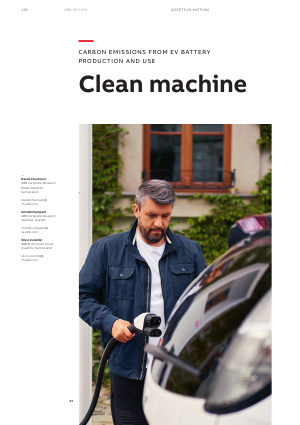

Button(description='Play Conversation', style=ButtonStyle())

In [54]:
# Display a play button to play the combined conversation
def play_audio(button):
    
    # Article cover 
    images = convert_from_path('./papers/'+user_journey['selected_journal'], 
                               first_page=user_journey['selected_article']['start_page'], 
                               last_page=user_journey['selected_article']['start_page'], 
                               size=(300, None))
    
    clear_output(wait=True)
    display(images[0])
    display(Audio(combined_filename))
    display(play_button)

play_button = widgets.Button(description="Play Conversation")
play_button.on_click(play_audio)
display(images[0])
display(play_button)

##### Create intro for the interview

In [127]:
from langchain.llms import AzureOpenAI
from langchain.prompts import PromptTemplate

# Create LLM (completion)
llm = AzureOpenAI(
    deployment_name="deployment-5af509f3323342ee919481751c6f8b7d",
    model_name="text-davinci-003",
    openai_api_base="https://abb-chcrc.openai.azure.com/",
    openai_api_version="2023-03-15-preview",
    openai_api_key=os.environ["OPENAI_API_KEY_AZURE"],
    openai_api_type="azure",
    temperature=0.8
)

template = """Based on the theme "{theme}", the target audience of "{audience}", and the 
questions posed during the interview, craft a short introductory text for the interview in the tone of a journalist. 
The introductory text should set the stage for the interview and align with the essence of the conversation.
The introductory text should mention the company name ABB.

[Question History]: {question_list}
"""

prompt = PromptTemplate(
    template=template,
    input_variables=["theme", "audience", "question_list"],
)

response = llm.predict(prompt.format(theme='Tech and product insights', 
                                     audience=themes['Tech and product insights']['target audience'],
                                     question_list=question_list))
print(response)


ABB, a leading global engineering and technology company, recently released a report on the technical differences between battery electric vehicles (BEVs) and internal combustion engine (ICE) vehicles, and the differences between these vehicles in terms of emissions and electricity use. In this exclusive interview, R&D engineers at ABB discuss the key insights from the report, focusing on the study's estimates for emissions arising during BEV battery production and use, future scenarios for increasing battery energy density, and the significance of the findings that BEVs already have lower emissions than the best ICE vehicles in the EU and USA.


In [120]:
user_journey[]

{'selected_journal': 'ABB Review_02_2023_layout complete_EN_72-300dpi.pdf',
 'selected_article': {'start_page': 54,
  'title': 'Clean machine',
  'subtitle': 'Carbon emissions from EV battery production and use',
  'length': 4},
 'selected_topics': []}

In [121]:
themes['Tech and product insights']

{'description': 'Spotlight on new tech and product',
 'target audience': 'R&D engineers',
 'prompt': '\n        - Seek detailed information about the technology and product advancements. \n        - Explore the underlying tech innovations and their advantages.\n        - Discuss product features, benefits, and differentiators.\n        '}